In [ ]:
!nvidia-smi

Thu Nov 16 06:36:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 8000     On   | 00000000:1A:00.0 Off |                  Off |
| 33%   39C    P8    31W / 200W |      5MiB / 48601MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Quadro RTX 8000     On   | 00000000:68:00.0 Off |                  Off |
| 33%   

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

plt.style.use('seaborn-v0_8')

#フォント設定
#plt.rcParams['font.family'] = 'Times New Roman' # font familyの設定
#plt.rcParams['mathtext.fontset'] = 'stix' # math fontの設定
plt.rcParams["font.size"] = 50 # 全体のフォントサイズが変更されます。
plt.rcParams['xtick.labelsize'] = 15 # 軸だけ変更されます。
plt.rcParams['ytick.labelsize'] = 15 # 軸だけ変更されます


#軸設定
plt.rcParams['xtick.direction'] = 'in' #x軸の目盛りの向き
plt.rcParams['ytick.direction'] = 'in' #y軸の目盛りの向き
#plt.rcParams['axes.grid'] = True # グリッドの作成
#plt.rcParams['grid.linestyle']='--' #グリッドの線種
#plt.rcParams["xtick.minor.visible"] = True  #x軸補助目盛りの追加
#plt.rcParams["ytick.minor.visible"] = True  #y軸補助目盛りの追加
#plt.rcParams['xtick.top'] = True  #x軸の上部目盛り
#plt.rcParams['ytick.right'] = True  #y軸の右部目盛り


#軸大きさ
plt.rcParams["xtick.major.width"] = 1.0             #x軸主目盛り線の線幅
plt.rcParams["ytick.major.width"] = 1.0             #y軸主目盛り線の線幅
plt.rcParams["xtick.minor.width"] = 1.0             #x軸補助目盛り線の線幅
plt.rcParams["ytick.minor.width"] = 1.0             #y軸補助目盛り線の線幅
plt.rcParams["xtick.major.size"] = 10               #x軸主目盛り線の長さ
plt.rcParams["ytick.major.size"] = 10               #y軸主目盛り線の長さ#
plt.rcParams["xtick.minor.size"] = 5                #x軸補助目盛り線の長さ
plt.rcParams["ytick.minor.size"] = 5                #y軸補助目盛り線の長さ
plt.rcParams["axes.linewidth"] = 1.0                #囲みの太さ


#凡例設定
plt.rcParams["legend.fancybox"] = False  # 丸角OFF
plt.rcParams["legend.framealpha"] = 1  # 透明度の指定、0で塗りつぶしなし
plt.rcParams["legend.edgecolor"] = 'black'  # edgeの色を変更
plt.rcParams["legend.markerscale"] = 20 #markerサイズの倍率

from model import OnlyMLP


In [4]:
class Exp(object):
    def __init__(self) -> None:
        # Learning Parameter
        self.lr=1e-3 
        self.weight_decay =  0.0
        self.p=67 
        self.d_emb = 500
        self.d_model =  48
        self.is_symmetric_input = True

        # Stop training when test loss is <stopping_thresh
        self.stopping_thresh = -1
        self.seed = 1


        self.num_layers = 0
        self.batch_style = 'full' # ['full', 'random'] 
        self.d_vocab = self.p
        self.n_ctx = 2
        self.d_mlp = 1*self.d_model
        self.num_heads = 1
        assert self.d_model % self.num_heads == 0
        self.d_head = self.d_model//self.num_heads  
        self.act_type = 'ReLU'  # ['ReLU', 'GELU']
        self.weight_scale = 1 #0.5576312536233431
        self.prune_rate = 0.4                               
        self.weight_ratio = -1#0.6493382079831002 #0.4152939027995708

        self.use_ln = False

        self.random_answers = np.random.randint(low=0, high=self.p, size=(self.p, self.p))

        self.fns_dict = {'add': lambda x,y:(x+y)%self.p, 'subtract': lambda x,y:(x-y)%self.p, \
                         'x2xyy2':lambda x,y:(x**2+x*y+y**2)%self.p, 'rand':lambda x,y:self.random_answers[x][y],\
                          "only_add": lambda x,y:(x+y)}
        
        
        # pruning
        self.pruner = "mag" # ["rand", "mag", "snip", "grasp", "synflow"]
        self.sparsity = 0.4 #0.7 #0.29#0.4#0.598#1#0.3
        self.schedule = "linear" # ["linear", "exponential"]
        self.scope = "global" # ["global", "local"]
        self.epochs =  1           
        self.reinitialize =  True
        self.train_mode = False
        self.shuffle = False
        self.invert = False
        if self.is_symmetric_input:
            self.batch_size =  (self.p**2 - self.p)//2
        else:
            self.batch_size =  self.p**2


In [5]:
def cross_entropy(logits, labels):
    return np.sum(- labels * np.log(logits))

# init

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 67])


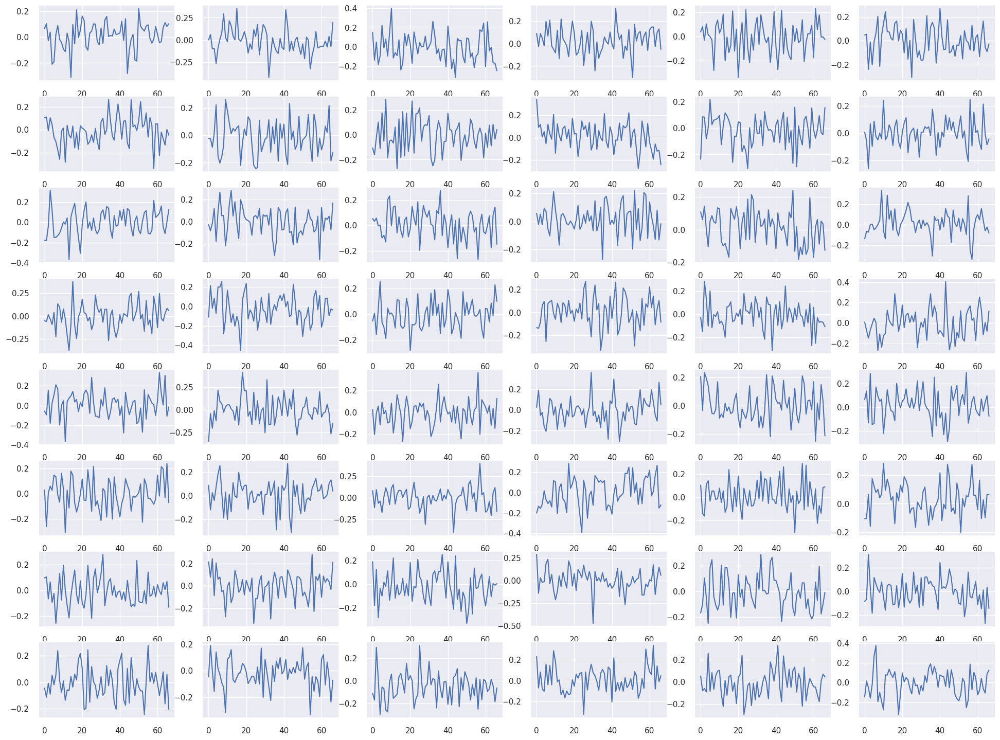

In [6]:
weight_path = "/home/0927/exp1/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1WD_TrueS_        1WS_1seed/init.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_inproj = model.state_dict()["inproj.W"]
W_outproj = model.state_dict()["outproj.W"]
W_U = model.state_dict()["unembed.W_U"]
W_in =  W_inproj @ W_E
print(W_in.shape)
num_neuron, d_in = W_in.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_init.png", bbox_inches='tight', pad_inches=0.05)

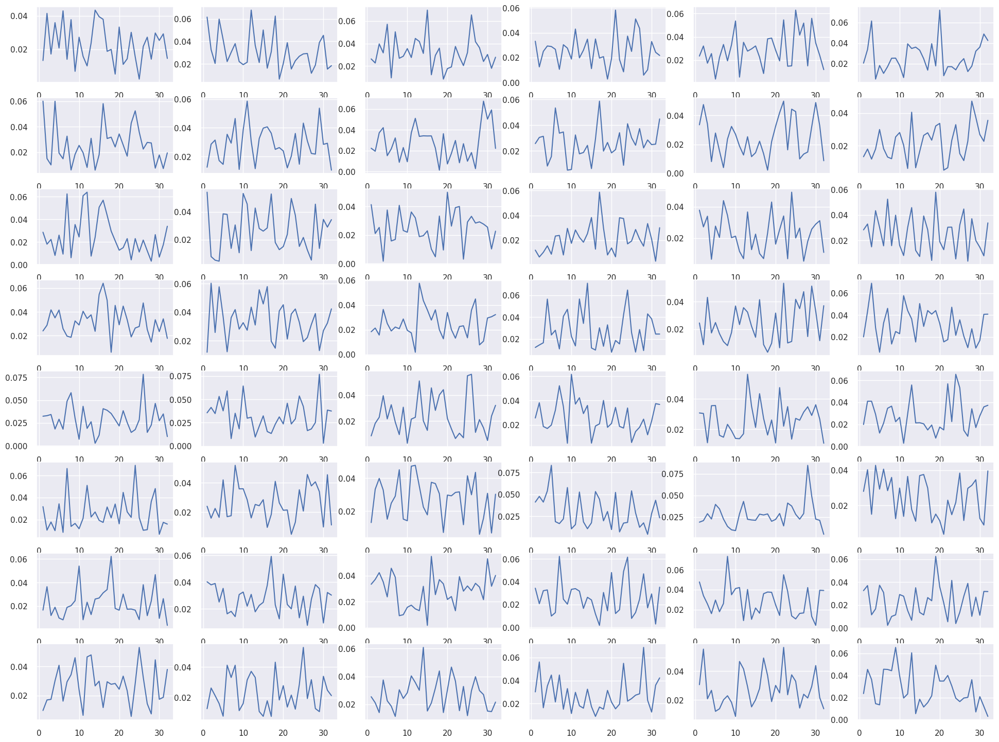

In [7]:
f_s = 67 # サンプリングレート f_s[Hz] (任意)
t_fin = 1 # 収録終了時刻 [s] (任意)
dt = 1/f_s # サンプリング周期 dt[s]
N = int(f_s * t_fin) # サンプル数 [個]
fig,axis = plt.subplots(8,6,figsize=(24,18))
base_init = []
for i_neuron in range(num_neuron):      
    y = W_in[i_neuron]  
    y_fft = np.fft.fft(y) # 離散フーリエ変換
    freq = np.fft.fftfreq(N, d=dt) # 周波数を割り当てる（※後述）
    Amp = abs(y_fft/(N/2)) # 音の大きさ（振幅の大きさ）
    axis[i_neuron%8][i_neuron//8].plot(freq[1:int(N/2)], Amp[1:int(N/2)]) # A-f グラフのプロット
    base_init.append(Amp[1:int(N/2)])

## output

torch.Size([48, 67])


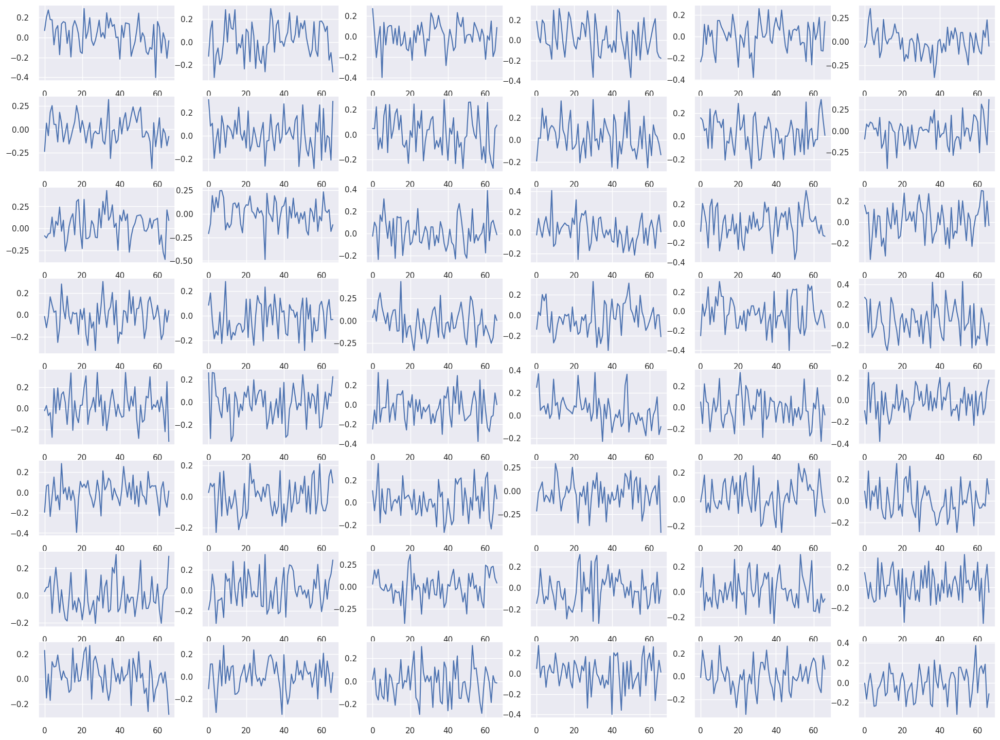

In [8]:
W_out =   W_outproj.T @ W_U
print(W_out.shape)
num_neuron, d_in = W_out.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_out[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_init_out.png", bbox_inches='tight', pad_inches=0.05)

## at 2000

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 67])


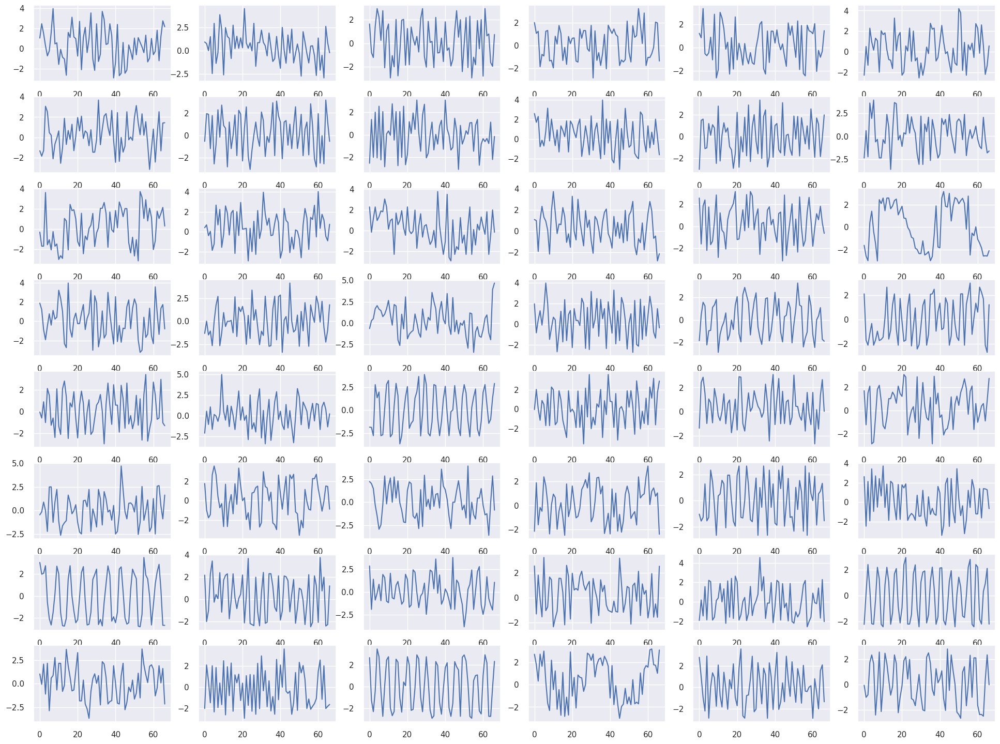

In [9]:
weight_path = "/home/0927/exp1/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1WD_TrueS_        1WS_1seed/2000.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_inproj = model.state_dict()["inproj.W"]
W_outproj = model.state_dict()["outproj.W"]
W_U = model.state_dict()["unembed.W_U"]
W_in =  W_inproj @ W_E
print(W_in.shape)
num_neuron, d_in = W_in.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_2000.png", bbox_inches='tight', pad_inches=0.05)

# at 6000

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 67])


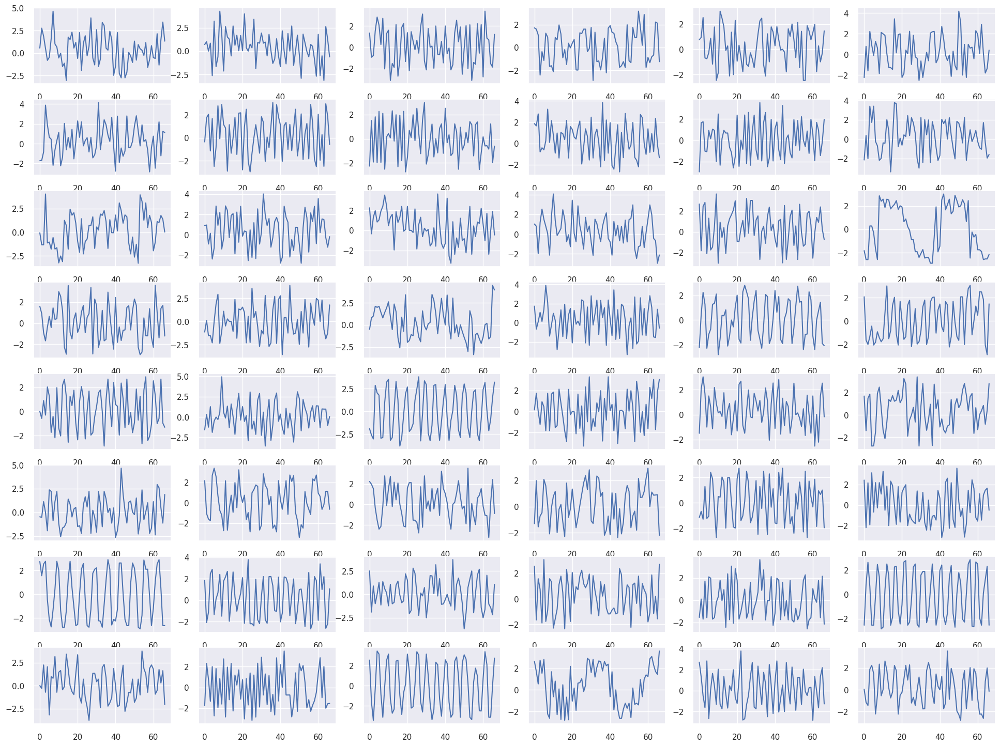

In [10]:
weight_path = "/home/0927/exp1/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1WD_TrueS_        1WS_1seed/4000.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_inproj = model.state_dict()["inproj.W"]
W_outproj = model.state_dict()["outproj.W"]
W_U = model.state_dict()["unembed.W_U"]
W_in =  W_inproj @ W_E
print(W_in.shape)
num_neuron, d_in = W_in.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_4000.png", bbox_inches='tight', pad_inches=0.05)

# after grok

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 67])


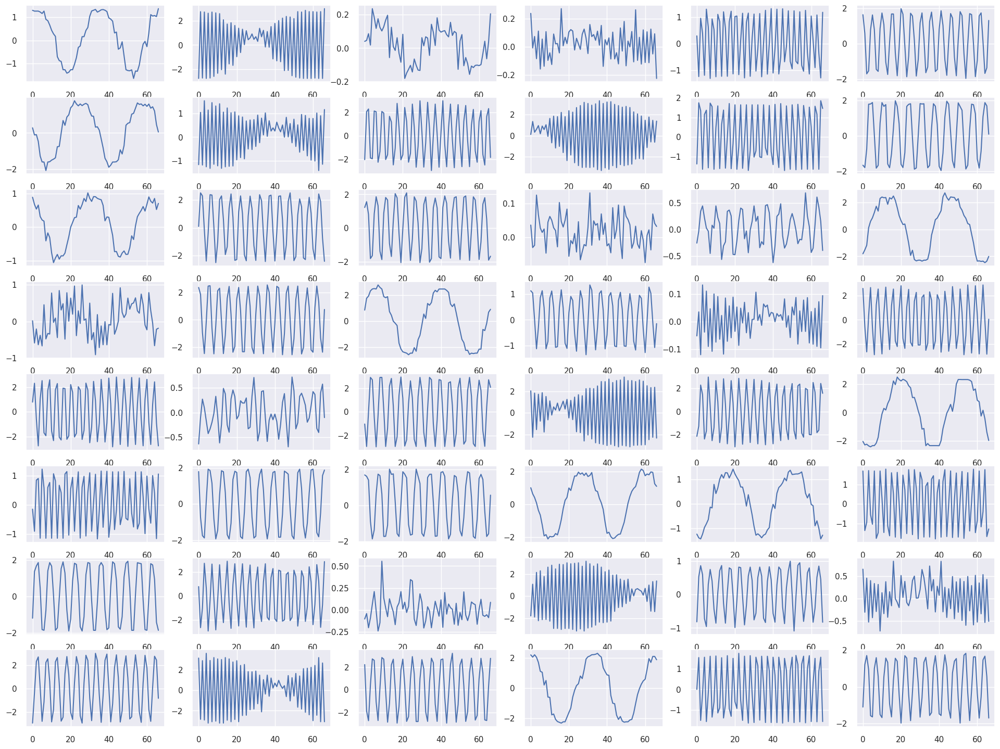

In [11]:
weight_path = "/home/0927/exp1/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1WD_TrueS_        1WS_1seed/final.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_inproj = model.state_dict()["inproj.W"]
W_outproj = model.state_dict()["outproj.W"]
W_U = model.state_dict()["unembed.W_U"]
W_in =  W_inproj @ W_E
print(W_in.shape)
num_neuron, d_in = W_in.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
plt
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_final.png", bbox_inches='tight', pad_inches=0.05)

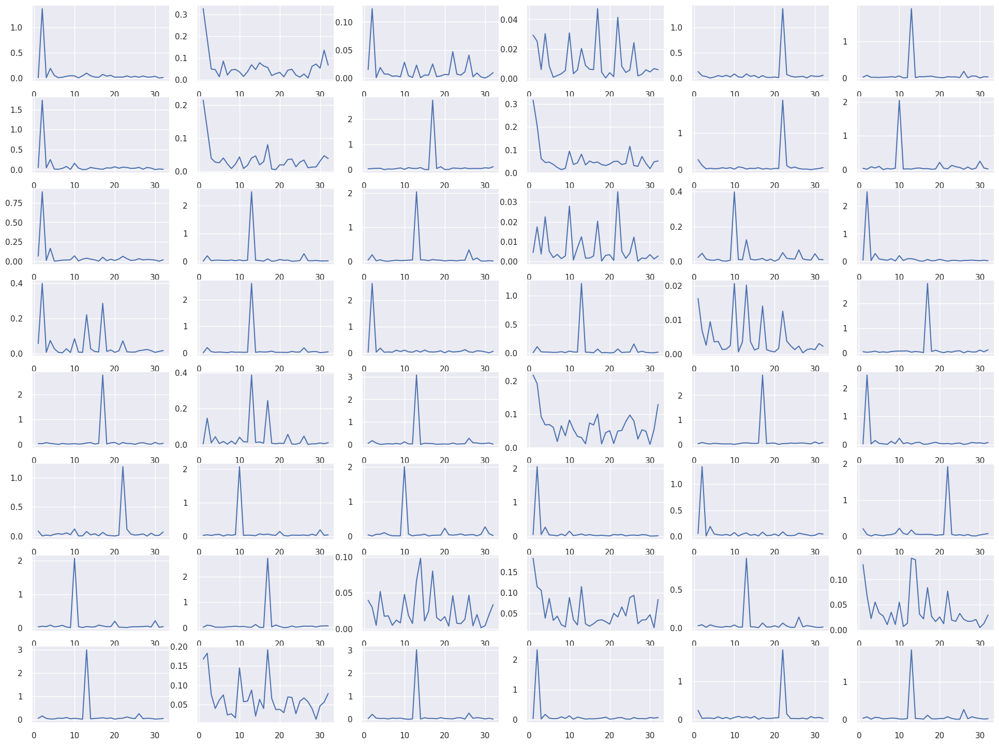

In [12]:
f_s = 67 # サンプリングレート f_s[Hz] (任意)
t_fin = 1 # 収録終了時刻 [s] (任意)
dt = 1/f_s # サンプリング周期 dt[s]
N = int(f_s * t_fin) # サンプル数 [個]
fig,axis = plt.subplots(8,6,figsize=(24,18))
gt = []
for i_neuron in range(num_neuron):      
    y = W_in[i_neuron]  
    y_fft = np.fft.fft(y) # 離散フーリエ変換
    freq = np.fft.fftfreq(N, d=dt) # 周波数を割り当てる（※後述）
    Amp = abs(y_fft/(N/2)) # 音の大きさ（振幅の大きさ）
    axis[i_neuron%8][i_neuron//8].plot(freq[1:int(N/2)], Amp[1:int(N/2)]) # A-f グラフのプロット
    gt.append(Amp[1:int(N/2)])

In [13]:
mean = 0
for i in range(num_neuron):
    mean += cross_entropy(gt[i], base_init[i])
mean /= num_neuron
print(mean)

2.990613681526277


torch.Size([48, 67])


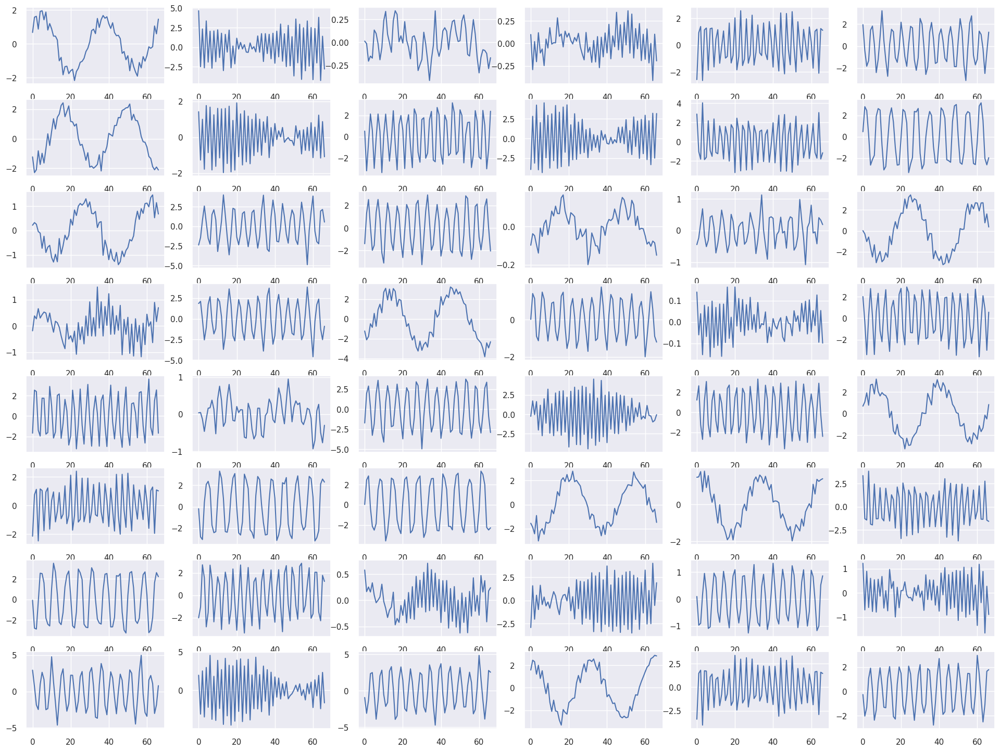

In [14]:
W_out =   W_outproj.T @ W_U
print(W_out.shape)
num_neuron, d_in = W_out.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_out[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/base_final_out.png", bbox_inches='tight', pad_inches=0.05)

## type

# grokking ticket

## init

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
tensor([130., 203.,  17.,   1., 309., 138., 379., 385., 363.,  65., 331., 340.,
          0., 357., 345., 400.,   0., 354., 235., 372., 425., 330.,   0., 407.,
          0., 413.,   0.,  27., 403., 262., 384., 347., 198., 331.,   0.,   0.,
        356., 114.,   4., 334., 195., 341., 388., 355., 338., 345.,  12., 181.])
(tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 13, 14, 15, 17, 18, 19,
        20, 21, 23, 25, 27, 28, 29, 30, 31, 32, 33, 36, 37, 38, 39, 40, 41, 42,
        43, 44, 45, 46, 47]),)


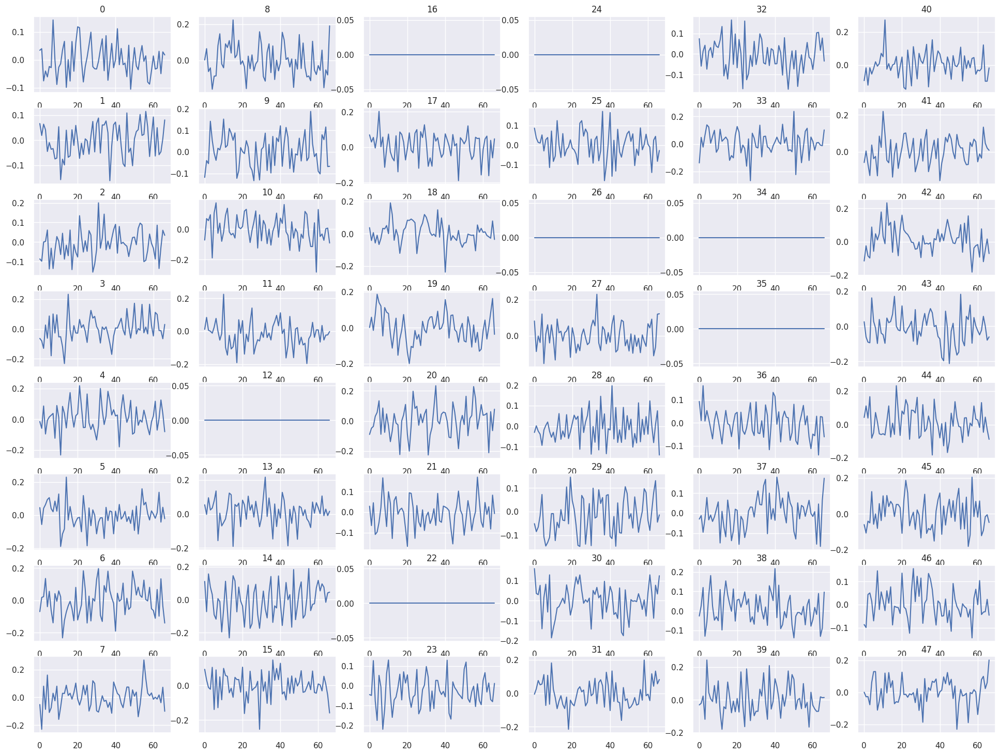

In [31]:
weight_path = "/home/0927/exp7/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1.0WD_TrueS_        1WS_0.4_sparsity_1seed_finalepoch_mag_pruner/init.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_E_mask = model.state_dict()["embed.weight_mask"]
W_inproj = model.state_dict()["inproj.W"]
W_inproj_mask = model.state_dict()["inproj.weight_mask"]
idx = torch.where((W_inproj_mask).sum(axis=1)>0 )
print((W_inproj_mask).sum(axis=1))
print(idx)
W_inproj_mask[idx] = 1
W_outproj = model.state_dict()["outproj.W"]
W_outproj_mask = model.state_dict()["outproj.weight_mask"]
W_U = model.state_dict()["unembed.W_U"]
W_U_mask = model.state_dict()["unembed.weight_mask"]
#print((W_inproj*W_inproj_mask).shape)
#print((W_E*W_E_mask).shape)
W_in =  (W_inproj*W_inproj_mask) @ (W_E*W_E_mask)
#print(W_in.shape)
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
    axis[i_neuron%8][i_neuron//8].set_title(str(i_neuron))
plt.savefig("/home/fig/grok_init.png", bbox_inches='tight', pad_inches=0.05)

In [15]:
for p in model.parameters():
    print(p)

Parameter containing:
tensor([[-0.0094,  0.0174, -0.0245,  ..., -0.0275, -0.0308, -0.0391],
        [-0.1047,  0.0119,  0.0367,  ...,  0.0409, -0.0687,  0.0684],
        [-0.0318,  0.0129, -0.0277,  ..., -0.0008, -0.0152, -0.0942],
        ...,
        [ 0.0107, -0.0457, -0.0003,  ..., -0.0247,  0.0374,  0.0201],
        [ 0.0145, -0.0672,  0.0375,  ..., -0.0321, -0.0177, -0.0176],
        [ 0.0776, -0.0354, -0.0422,  ..., -0.1046,  0.0507,  0.0046]],
       requires_grad=True)
Parameter containing:
tensor([[-0.1522, -0.0179,  0.0198,  ...,  0.1367,  0.0460,  0.0601],
        [-0.0168,  0.0046,  0.0482,  ...,  0.1001,  0.0439, -0.1060],
        [-0.2030,  0.0581, -0.0429,  ..., -0.1215, -0.0059,  0.0555],
        ...,
        [-0.2067,  0.0881, -0.1421,  ...,  0.1665,  0.2134,  0.0178],
        [-0.1320,  0.0285, -0.1647,  ..., -0.0358,  0.0271, -0.2625],
        [ 0.0071,  0.0996, -0.1093,  ...,  0.0756,  0.0253, -0.0223]],
       requires_grad=True)
Parameter containing:
tensor([[ 0.

NameError: name 'grok_init_' is not defined

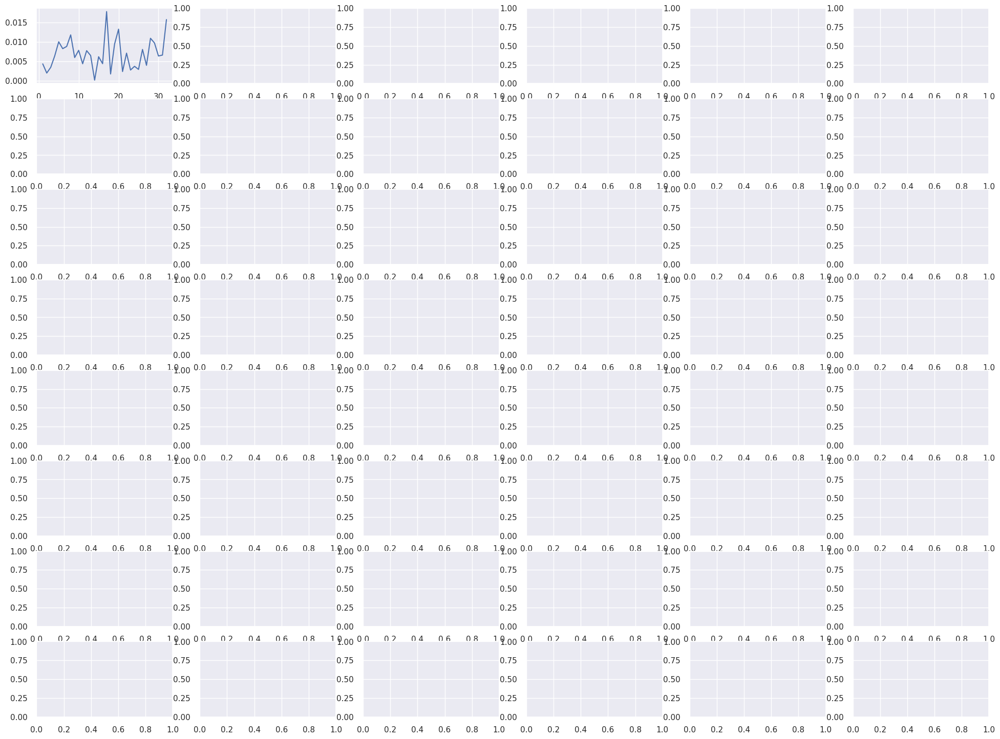

In [16]:
f_s = 67 # サンプリングレート f_s[Hz] (任意)
t_fin = 1 # 収録終了時刻 [s] (任意)
dt = 1/f_s # サンプリング周期 dt[s]
N = int(f_s * t_fin) # サンプル数 [個]
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):      
    y = W_in[i_neuron]  
    y_fft = np.fft.fft(y) # 離散フーリエ変換
    freq = np.fft.fftfreq(N, d=dt) # 周波数を割り当てる（※後述）
    Amp = abs(y_fft/(N/2)) # 音の大きさ（振幅の大きさ）
    axis[i_neuron%8][i_neuron//8].plot(freq[1:int(N/2)], Amp[1:int(N/2)]) # A-f グラフのプロット

torch.Size([48, 67])


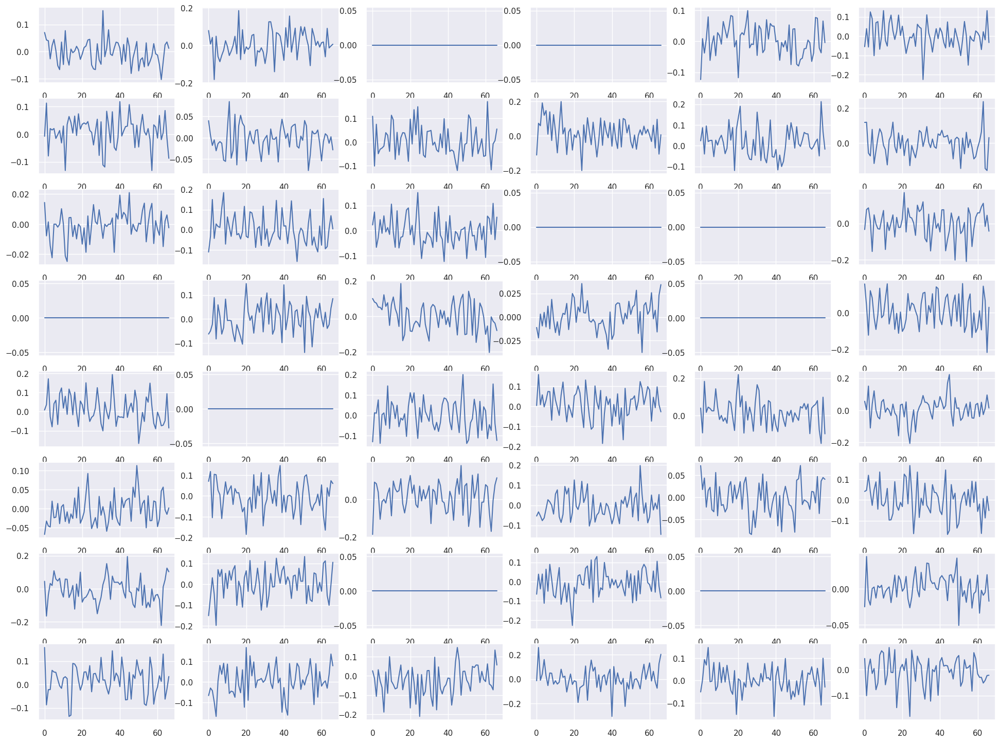

In [ ]:
W_out =  (W_outproj*W_outproj_mask).T @ (W_U*W_U_mask)
print(W_out.shape)
num_neuron, d_in = W_out.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_out[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/grok_init_out.png", bbox_inches='tight', pad_inches=0.05)

## at 4000

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 500])
torch.Size([500, 67])
torch.Size([48, 67])


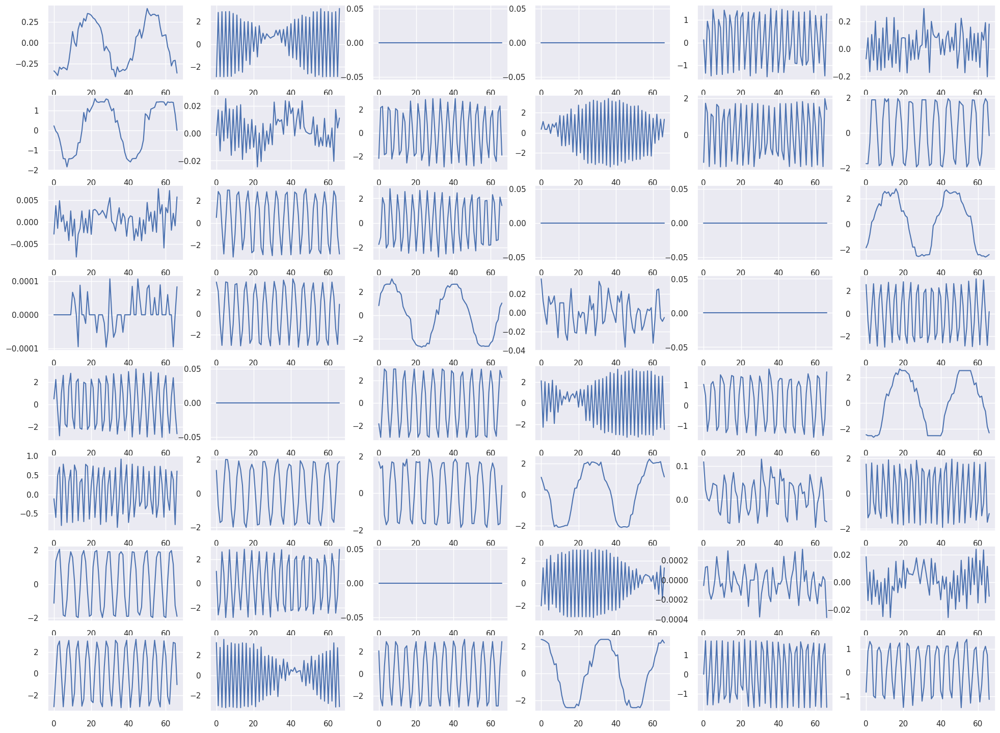

In [20]:
weight_path = "/home/0927/exp7/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1.0WD_TrueS_        1WS_0.4_sparsity_1seed_finalepoch_mag_pruner/4000.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_E_mask = model.state_dict()["embed.weight_mask"]
W_inproj = model.state_dict()["inproj.W"]
W_inproj_mask = model.state_dict()["inproj.weight_mask"]
W_outproj = model.state_dict()["outproj.W"]
W_outproj_mask = model.state_dict()["outproj.weight_mask"]
W_U = model.state_dict()["unembed.W_U"]
W_U_mask = model.state_dict()["unembed.weight_mask"]
print((W_inproj*W_inproj_mask).shape)
print((W_E*W_E_mask).shape)
W_in =  (W_inproj*W_inproj_mask) @ (W_E*W_E_mask)
W_in_mask = W_inproj_mask @ W_E_mask
print(W_in.shape)
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/grok_4000.png", bbox_inches='tight', pad_inches=0.05)

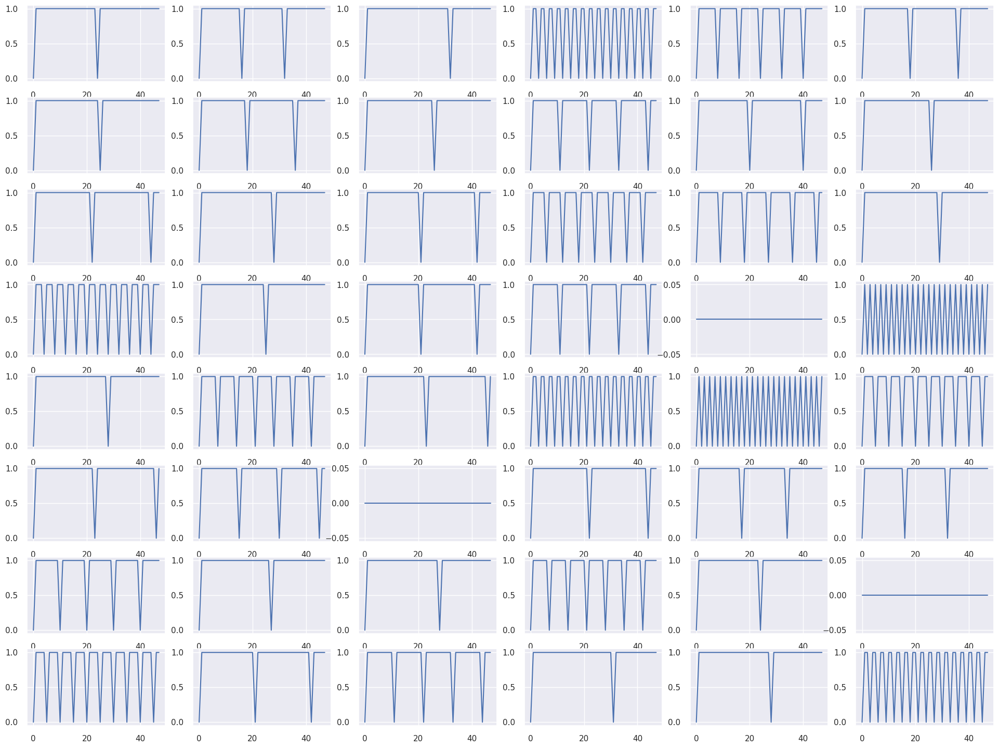

In [34]:
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    f = np.random.randint(1, 33)
    y=[0 if x % f == 0 else 1 for x in range(num_neuron)]
    axis[i_neuron%8][i_neuron//8].plot(y, label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].bar(np.arange(W_in_mask[i_neuron].shape[0]),W_in_mask[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')

torch.Size([48, 67])


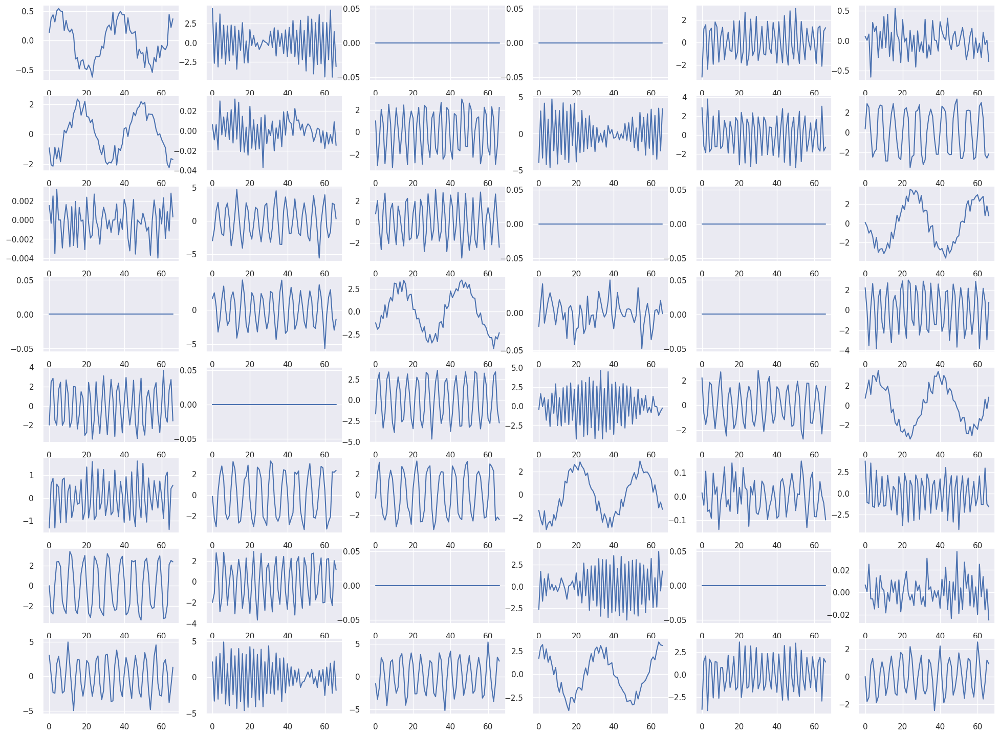

In [ ]:
W_out =  (W_outproj*W_outproj_mask).T @ (W_U*W_U_mask)
print(W_out.shape)
num_neuron, d_in = W_out.shape
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_out[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/grok_4000_out.png", bbox_inches='tight', pad_inches=0.05)

## final

odict_keys(['unembed.W_U', 'unembed.weight_mask', 'embed.W_E', 'embed.weight_mask', 'inproj.W', 'inproj.weight_mask', 'outproj.W', 'outproj.weight_mask'])
torch.Size([48, 500])
torch.Size([500, 67])
torch.Size([48, 67])


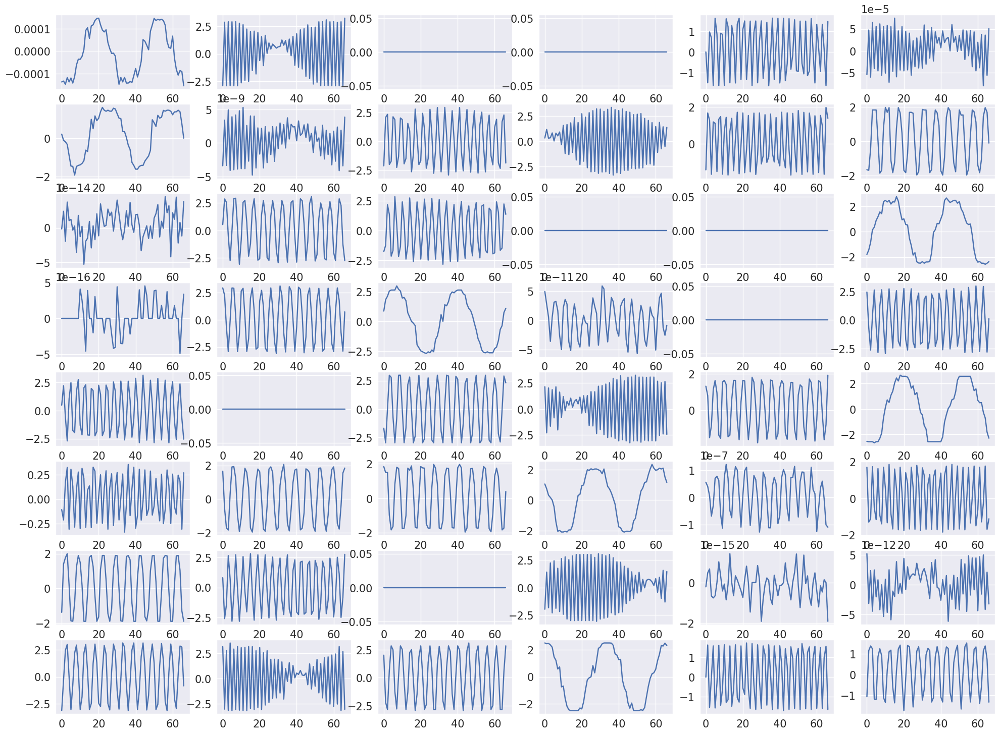

In [ ]:
weight_path = "/home/0927/exp7/mlp/mlp_0L_48D_67P_        0.4F_0.001LR_1.0WD_TrueS_        1WS_0.4_sparsity_1seed_finalepoch_mag_pruner/final.pth"
config = Exp()
model = OnlyMLP(num_layers=config.num_layers, d_vocab=config.d_vocab, \
                        d_model=config.d_model, d_emb=config.d_emb, \
                        act_type=config.act_type,  use_ln=config.use_ln, \
                        weight_scale=config.weight_scale)
model.load_state_dict(torch.load(weight_path)["model"])
print(model.state_dict().keys())
W_E = model.state_dict()["embed.W_E"]
W_E_mask = model.state_dict()["embed.weight_mask"]
W_inproj = model.state_dict()["inproj.W"]
W_inproj_mask = model.state_dict()["inproj.weight_mask"]
W_outproj = model.state_dict()["outproj.W"]
W_outproj_mask = model.state_dict()["outproj.weight_mask"]
W_U = model.state_dict()["unembed.W_U"]
W_U_mask = model.state_dict()["unembed.weight_mask"]
print((W_inproj*W_inproj_mask).shape)
print((W_E*W_E_mask).shape)
W_in =  (W_inproj*W_inproj_mask) @ (W_E*W_E_mask)
print(W_in.shape)
fig,axis = plt.subplots(8,6,figsize=(24,18))
for i_neuron in range(num_neuron):
    axis[i_neuron%8][i_neuron//8].plot(W_in[i_neuron], label=str(i_neuron))
    #axis[i_neuron%8][i_neuron//8].axis('off')
plt.savefig("/home/fig/grok_final.png", bbox_inches='tight', pad_inches=0.05)